#Análise Exploratória de dados da qualidade de ar histórica nos estados da Índia

## Groupo 5 - Pela Ciência
### Componentes:
* Éricles Maurício
* João Gabriel Falcão
* Kleber Medeiros
* Pedro Barbosa
* Vinícius Carneiro
* Vinícius Matos

### Atividade:
Escolher uma base de dados real e realizar as seguintes atividades:

1 - Descrever a base e todos os atributos;

2- Limpeza inicial dos dados
- Remover linhas duplicadas;
- Correção dos tipos de dados dos atributos;
- Identificar e tratar dados ausentes (lembrar que podem existir dados ausentes que não sejam nulos, ex.: peso com valor 0, strings como "-", etc.) e tratar (exclusão, preencher com mediana ou, se série temporal, com o valor imediatamente anterior ou posterior);
- Identificar outliers e, se necessário, tratá-los.
- Lembrem-se que outliers podem ser reais, como um salário do presidente da empresa, ou fruto de erros, como uma pessoa com 250 anos. Outliers reais podem ser mantidos em fase de análise exploratória para compreensão dos dados, outliers provenientes de erros devem ser tratados, seja com exclusão ou preenchimento (similar ao tratamento de dados ausentes).

3 - Análise univariada: analisar a distribuição de todos os atributos de acordo com o tipo de informação que eles trazem (atributos contínuos e categóricos são analisados de forma diferente).
Exemplos de análises:
- Identificar presença de outliers;
- Desbalanceamento entre categorias (atributos categóricos);
- Os dados seguem uma distribuição normal? (atributos contínuos);
- Relação entre média, mediana, máximo, mínimo...

3- Análise bivariada:
- Identificar quais atributos são mais correlacionados;
- Escolher um atributo target, analisar os dados em função dele e destacar os insights que tiveram;
- Durante esse processo vocês devem responder pelo menos 7 perguntas envolvendo:
- 2 atributos categóricos;
- 2 atributos contínuos;
- 1 atributo contínuo x 1 atributo categórico.

Postem o notebook e o conjunto de dados. A organização do código, legibilidade e documentação são quesitos avaliativos. Lembrem-se de destacar sempre o que vocês observaram nas tabelas e gráficos gerados.

Basta uma pessoa postar o trabalho por equipe.

### Inicialização

In [ ]:
from google.colab import files
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer


In [ ]:

sns.set_style("whitegrid")

# encoding precisa ser alterado, pois UTF-8 vai gerar errors, é importante adicionar o low_memory = False pois apitava erro
backup = pd.read_csv('data.csv', encoding = "ISO-8859-1", parse_dates=['date'], low_memory=False)

# Definindo o numero de casas decimais apresentadas no notbook
pd.set_option('display.float_format', '{:.2f}'.format)

In [ ]:
df = backup.copy()

In [ ]:
backup = df.copy()

## pre-processamento de dados


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 435742 entries, 0 to 435741
Data columns (total 13 columns):
 #   Column                       Non-Null Count   Dtype         
---  ------                       --------------   -----         
 0   stn_code                     291665 non-null  object        
 1   sampling_date                435739 non-null  object        
 2   state                        435742 non-null  object        
 3   location                     435739 non-null  object        
 4   agency                       286261 non-null  object        
 5   type                         430349 non-null  object        
 6   so2                          401096 non-null  float64       
 7   no2                          419509 non-null  float64       
 8   rspm                         395520 non-null  float64       
 9   spm                          198355 non-null  float64       
 10  location_monitoring_station  408251 non-null  object        
 11  pm2_5                     

In [ ]:
df.head()

,stn_code,sampling_date,state,location,agency,type,so2,no2,rspm,spm,location_monitoring_station,pm2_5,date
0,150,February - M021990,Andhra Pradesh,Hyderabad,NaN,"Residential, Rural and other Areas",4.80,17.40,NaN,NaN,NaN,NaN,1990-02-01
1,151,February - M021990,Andhra Pradesh,Hyderabad,NaN,Industrial Area,3.10,7.00,NaN,NaN,NaN,NaN,1990-02-01
2,152,February - M021990,Andhra Pradesh,Hyderabad,NaN,"Residential, Rural and other Areas",6.20,28.50,NaN,NaN,NaN,NaN,1990-02-01
3,150,March - M031990,Andhra Pradesh,Hyderabad,NaN,"Residential, Rural and other Areas",6.30,14.70,NaN,NaN,NaN,NaN,1990-03-01
4,151,March - M031990,Andhra Pradesh,Hyderabad,NaN,Industrial Area,4.70,7.50,NaN,NaN,NaN,NaN,1990-03-01


In [ ]:
df.tail()

,stn_code,sampling_date,state,location,agency,type,so2,no2,rspm,spm,location_monitoring_station,pm2_5,date
435737,SAMP,24-12-15,West Bengal,ULUBERIA,West Bengal State Pollution Control Board,RIRUO,22.00,50.00,143.00,NaN,"Inside Rampal Industries,ULUBERIA",NaN,2015-12-24
435738,SAMP,29-12-15,West Bengal,ULUBERIA,West Bengal State Pollution Control Board,RIRUO,20.00,46.00,171.00,NaN,"Inside Rampal Industries,ULUBERIA",NaN,2015-12-29
435739,NaN,NaN,andaman-and-nicobar-islands,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT
435740,NaN,NaN,Lakshadweep,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT
435741,NaN,NaN,Tripura,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT


Até aqui podemos tirar algumas informações:

O dataset possui 13 colunas e 435739 linhas, com  a info de data repetida em 2 colunas;

Existem dados nulos em todas as colunas, excetuando State.

A maioria das colunas estão do tipo OBJECT e precisam ser adequadas.



Nossos atributos principais são:
* so2 - Quantidade de dióxido de enxofre em µg/m³ 
* no2 - Quantidade de dióxido de nitrogênio em µg/m³
* rspm  - Quantidade de partículas em suspesão respiráveis em µg/m³
* spm - Quantidade de partículas em suspesão em µg/m³
* pm2_5 - Quantidade de partículas em suspesão com tamanho menor que 2,5µm de diâmetro em µg/m³

Todas eles são do tipo float e já foram classificadas como tal

Eles são medidas da qualidade do ar na Índia pela presença/ausencia de particulas



Os atributos categóricos que estão como object são:

*   state - estado da coleta                
*   location - cidade da coleta             
*   agency - Agência de coleta                   
*   type - Tipo da área de coleta 
*   location_monitoring_station - localização da estação de monitoramento


A maioria das informações disponíveis são relacionadas ao nível/aumento de poluição, localização e data da amostragem dos estados da Índia.


 ### Removendo colunas não contribuintes para o estudo final

 Os dados de stn_code e Location_monitoring_station apresentam-se de maneira amplamente variada
 não apresentando uma padronização que possa agregar diretamente à analise 

 Sampling_date é uma coluna repetida de date, porém num formato mais diverso

Todas elas serão removidas da análise.

In [ ]:
df.drop(['stn_code','sampling_date', 'location_monitoring_station'], axis = 1 , inplace = True)


### Remoção das 3 ultimas linhas do Dataframe por conta da ausencia de dados


In [ ]:
df = df[:-3]

### Traduzindo o nome das colunas para entrega da atividade e facilitar na plotagem dos gráficos


In [ ]:

columns_name = ['Estado', 'Localizacao', 'Agencia', 'Tipo_regiao', 'SO2', 'NO2', 'rspm', 'spm', 'pm2_5', 'Data']
df.columns = columns_name

### Conversão dos tipos das variáveis

In [ ]:

# transformando no2 so2 smp rspm
df['NO2'] = df['NO2'].astype('float')
df['SO2'] = df['SO2'].astype('float')
df['spm'] = df['spm'].astype('float')
df['rspm'] = df['rspm'].astype('float')


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead


 Contando o numero de entradas df['Data'] que são NaN
 Esses dados não passsam informações que podem ser cronologicamente estudadas
 Logo, faz algum sentido descartar


In [ ]:
print(df['Data'].isna().sum()) 

4


In [ ]:
df = df.dropna(subset = ['Data'])

### Tratando a coluna 'Tipo_regiao'

Como o tipo de regiao é uma variável categórica, precisamos padronizar a escrita das entradas a fom de minimizar o número de categorias

In [ ]:

converter = {'Industrial Areas'                     : 'Industrial' 
             ,'Industrial'                          : 'Industrial'
             ,'Industrial Area'                     : 'Industrial'
             , 'Residential, Rural and other Areas' : 'Residencial ou outros'
             , 'Residential and others'             : 'Residencial ou outros' 
             , 'Residential'                        : 'Residencial ou outros'
             , 'Sensitive Areas'                    : 'Preservacao' 
             , 'Sensitive'                          : 'Preservacao'
             , 'Sensitive Area'                     : 'Preservacao'
             , 'RIRUO'                              : 'Residencial ou outros' 
             ,  np.nan                              : 'Residencial ou outros'
              }

df['Tipo_regiao'] = df['Tipo_regiao'].map(converter)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


### Tratando a coluna 'Estado'


Considerando que Uttaranchal e Uttarakhand são o mesmo estado com nomes diferentes (google)
substituimos tudo que tiver Uttaranchal por Uttarakhand


In [ ]:
df.loc[df['Estado'] == 'Uttaranchal', 'Estado'] = df.loc[df['Estado'] == 'Uttaranchal', ['Estado']].replace({'Uttaranchal':'Uttarakhand'})

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1884: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, val, pi)


### Extraindo ano e semestre para colunas dedicadas

Visto que temos uma range de Anos considerável, decidiu-se estipular duas variáveis temporais categóricas (Ano e Semestre) a fim de ser possível analisar a progressão da poluição ao longo do tempo. 

In [ ]:
df['Ano'] = df['Data'].dt.year

In [ ]:
df['Semestre'] = df.Data.dt.year.astype(str) + 'S'+ np.where(df.Data.dt.quarter.gt(2),2,1).astype(str)


### Transformando as colunas categóricas em 'category'

In [ ]:
df['Estado'] = df['Estado'].astype('category')
df['Localizacao'] = df['Localizacao'].astype('category')
df['Tipo_regiao'] = df['Tipo_regiao'].astype('category')
df['Agencia'] = df['Agencia'].astype('category')
df['Ano'] = df['Ano'].astype('category')
df['Semestre'] = df['Semestre'].astype('category')

### Informações gerais das colunas numéricas

In [ ]:
df.describe()

,SO2,NO2,rspm,spm,pm2_5
count,401092.00,419505.00,395516.00,198355.00,9314.00
mean,10.83,25.81,108.83,220.78,40.79
std,11.18,18.50,74.87,151.40,30.83
min,0.00,0.00,0.00,0.00,3.00
25%,5.00,14.00,56.00,111.00,24.00
50%,8.00,22.00,90.00,187.00,32.00
75%,13.70,32.20,142.00,296.00,46.00
max,909.00,876.00,6307.03,3380.00,504.00


De modo geral, pode-se observar que todos os dados estão mal distribuídos entre os quartis e há presença destacável de outliers, 
uma vez que a média e a mediana dos atributos são bem diferentes e possuem máximos descrepantes, bem como um desvio padrão elevado.

A coluna pm2_5 possui poucos valores em comparação com as demais colunas.

## Análise Univariada

In [ ]:
total_nan_at_pm2_5 = (df['pm2_5'].isna().sum()) 
pm2_5_len = df['pm2_5'].shape

total_nan_at_pm2_5/pm2_5_len

array([0.97862462])

Podemos verificar que praticamente 98% dos dados da coluna pm2_5 é tido como nulo.




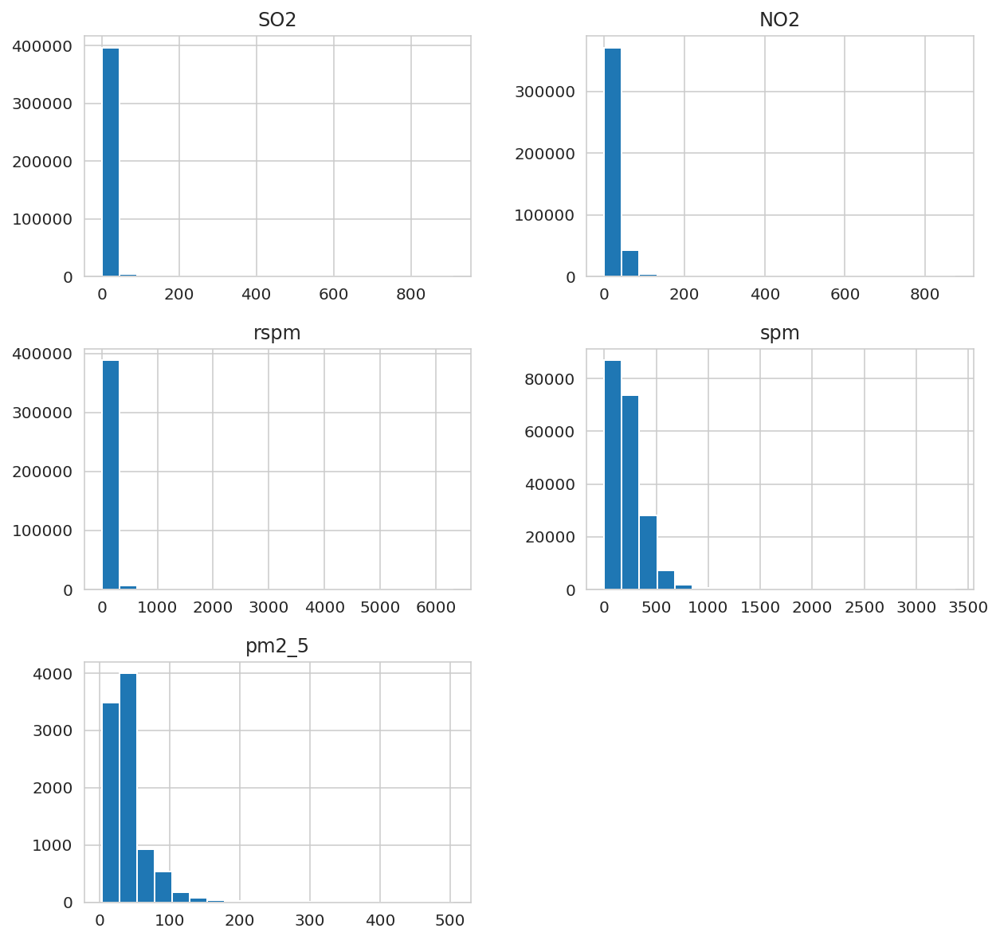

In [ ]:
numerals = ['SO2','NO2','rspm','spm','pm2_5']
df[numerals].hist(figsize=(10, 10), bins=20);

A partir dos gráficos acima é possível observar que os atributos relacionados a quantidade de particulas respiráveis e moléculas poluentes não seguem uma distribuição normal, possuindo média baixa e desvio padrão bem elevado.


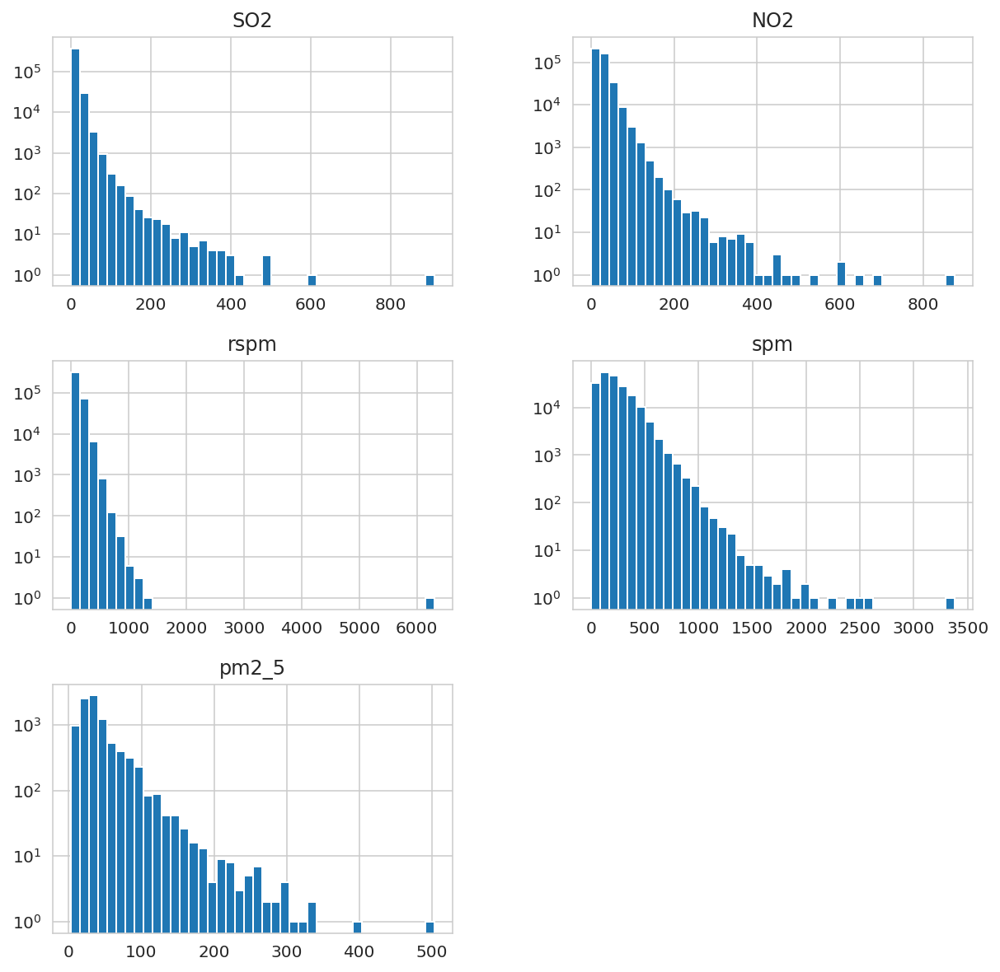

In [ ]:
numerals = ['SO2','NO2','rspm','spm','pm2_5']
df[numerals].hist(figsize=(10, 10), bins=40, log = True);

A distribuição melhorou ao aplicar o log de cada uma das colunas numéricas, porém a maior concentração dos dados está próxima de zero, o que faz sentido do ponto de vista analítico, uma vez que as particulas são indesejadas no ambiente e devem aproximar-se de zero numa situação ideal.

Nenhum deles pode ser inferior a zero e o melhor resultado possível precisa tender a zero, considerando que estas variáveis analisam a presença de poluentes. 



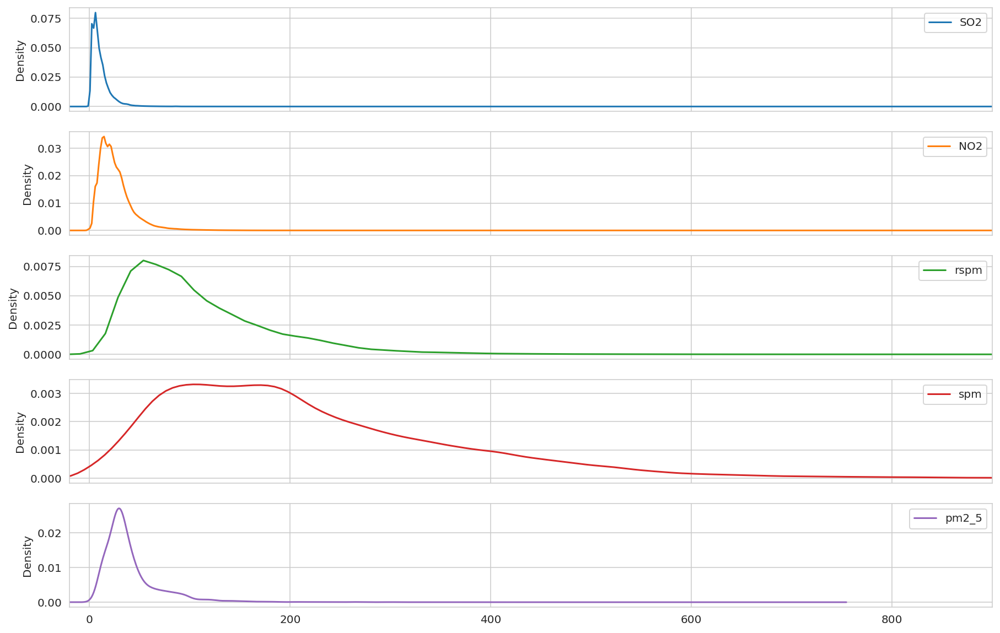

In [ ]:
numerals = ['SO2','NO2','rspm','spm','pm2_5']

(df[numerals]).plot(kind='density', subplots=True, layout=(5, 1), figsize=(15, 10), xlim = [-20,900]);


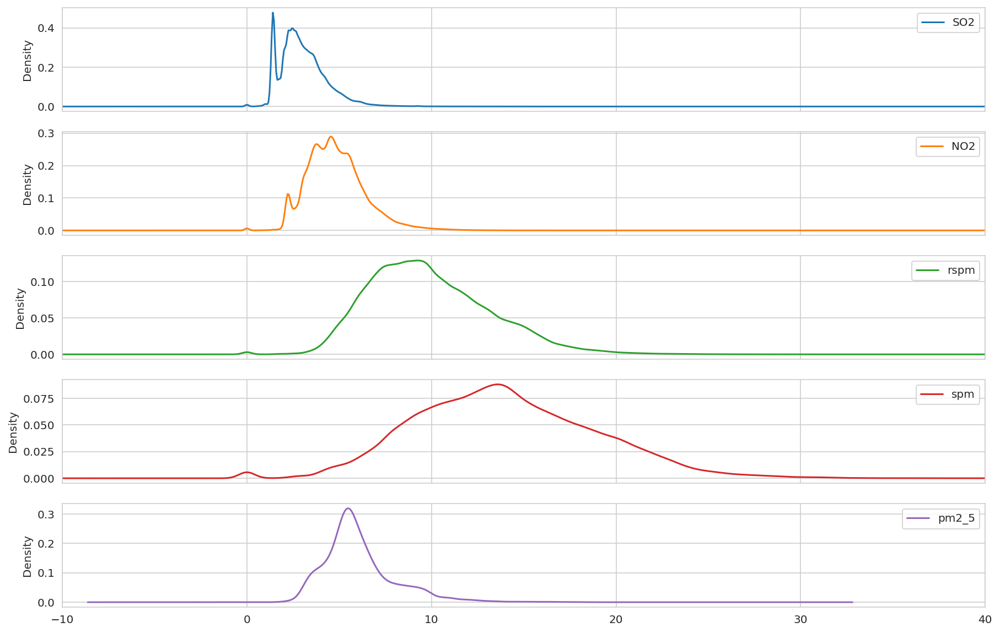

In [ ]:
numerals = ['SO2','NO2','rspm','spm','pm2_5']

(df[numerals]**(1/2)).plot(kind='density', subplots=True, layout=(5, 1), figsize=(15, 10), xlim = [-10,40]);

Pode-se observar de forma mais detalhada com o gráfico de densidade que algumas das variáveis possuem um distribuição normal quando olhamos com uma escala mais aproximada, apesar de não se comportarem de forma padrão, alguns tendo vários picos e outros tendo deformações na curva. A raiz quadrada foi importante para ajudar a deixar os diversos pontos mais próximos, diminuindo o desvio padrão

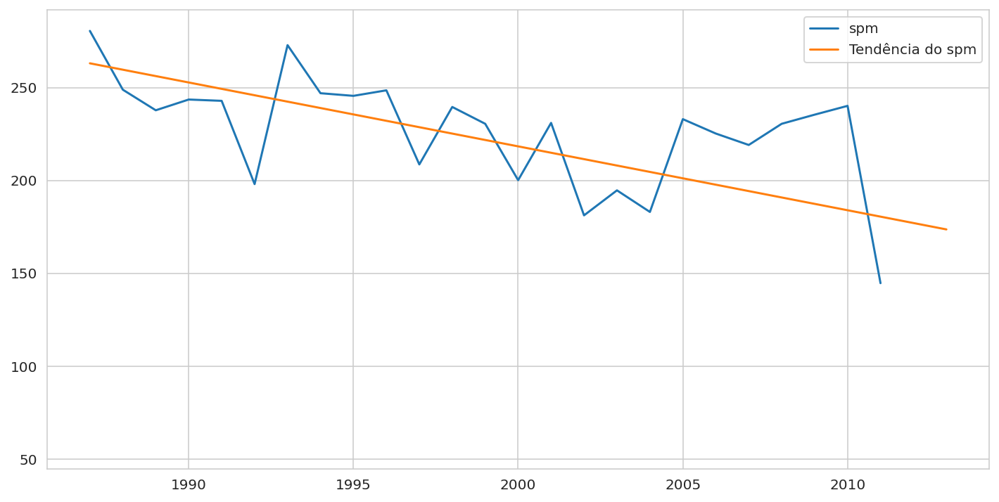

In [ ]:
df_by_year = df.sort_values(by = ['Ano'], ascending = True)
df_by_year['Ano'] =  df_by_year['Ano'].astype(int)

valid_years = list(range(1987,2014))
valid_years.remove(2012)

column = 'spm'

fig, ax = plt.subplots(figsize = (12, 6))


y = df_by_year.groupby(by=["Ano"]).mean()[column]
x = df_by_year['Ano'].unique()

ax.plot(x, y, label = column);

z = np.polyfit(valid_years, df_by_year.loc[(df_by_year['Ano']<2014) & (df_by_year['Ano'] != 2012)].groupby(by=["Ano"]).mean()[column],1)
p = np.poly1d(z)
ax.plot(range(1987,2014), p(range(1987,2014)), label = ("Tendência do " + str(column)))


ax.legend();


Com este gráfico, podemos perceber que a tendência de redução da quantidade de partículas spm a nível nacional possui um declive, diminuindo ao longo dos anos, mostrando uma melhora progressiva.

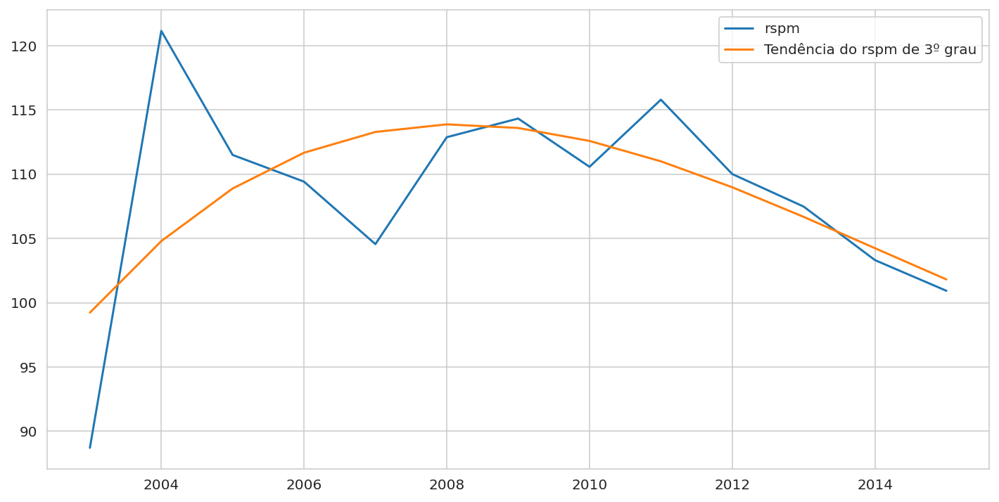

In [ ]:
df_by_year = df.sort_values(by = ['Ano'], ascending = True)
df_by_year['Ano'] =  df_by_year['Ano'].astype(int)

valid_years = list(range( 2003, 2016))
column = 'rspm'


fig, ax = plt.subplots(figsize = (12, 6))

y = df_by_year.groupby(by=["Ano"]).mean()[column]

x = df_by_year['Ano'].unique()

ax.plot(x, y, label = column);


z2 = np.polyfit(valid_years, df_by_year.loc[(df_by_year['Ano']>2002)].groupby(by=["Ano"]).mean()[column],3)
p2 = np.poly1d(z2)
ax.plot(range(2003,2016), p2(range(2003,2016)), label = ("Tendência do " + str(column)+" de 3º grau"))


ax.legend();

Com relação ao rspm, utilizando um algorítmo de aproximação polinomial de terceiro grau, podemos ver que apesar no aumento considerável nos anos próximos a 2003, a tendência geral é negativa, demostrando uma leve melhora dos níveis de poluentes rspm no ar nos últimos anos.

## Análise multivariada

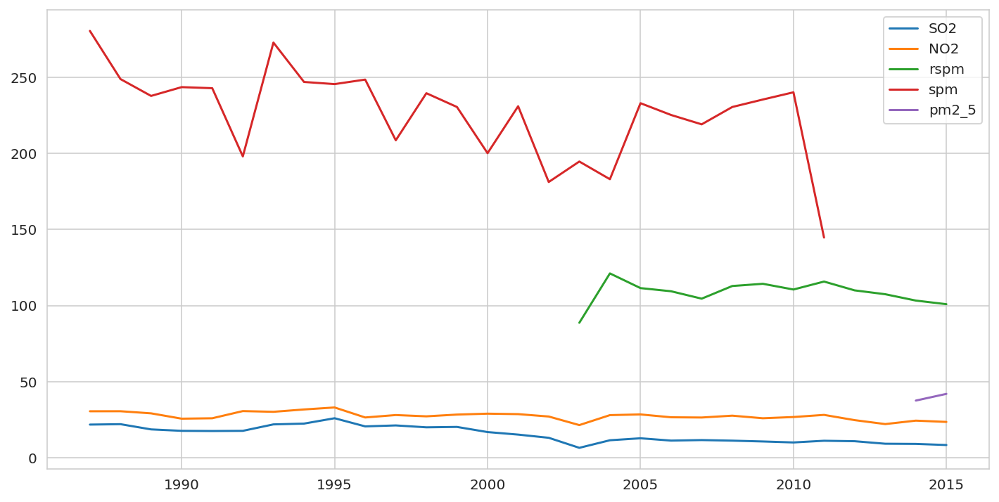

In [ ]:
df_by_year = df.sort_values(by = ['Ano'], ascending = True)

numerals = ['SO2','NO2','rspm','spm','pm2_5']

fig, ax = plt.subplots(figsize = (12, 6))
for column in (numerals):
    y = df_by_year.groupby(by=["Ano"]).mean()[column]
    x = df_by_year['Ano'].cat.categories 
    ax.plot(x, y, label = column);
ax.legend();


Vê-se através deste gráfico que os valores de spm deixaram de serem computados em 2013, enquanto que os dados de rspm tiveram seu início em 2003.

Nota-se que pm2_5 e spm não possuem nenhuma intersecção de dados, justificando o resultado do Heatmap abaixo.

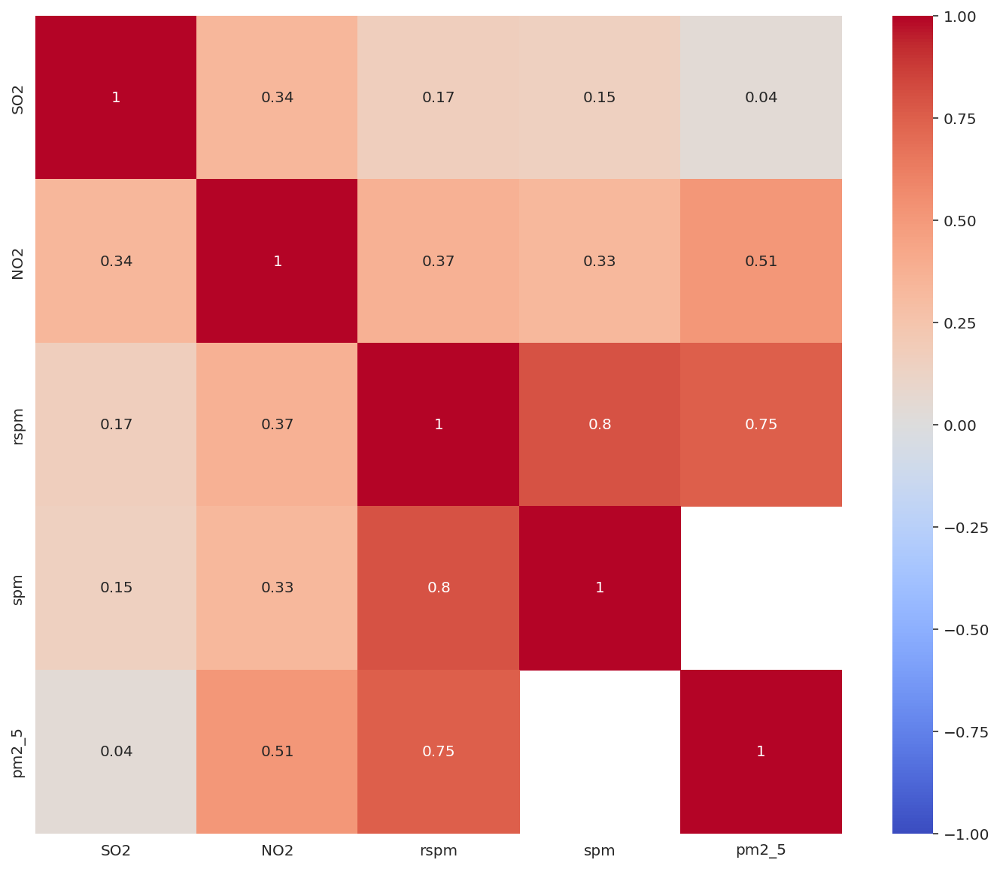

In [ ]:
fig = plt.figure()
fig.set_size_inches(12, 10)
sns.heatmap(round(df.corr(),2), annot = True, vmin=-1, vmax=1, center= 0, cmap= 'coolwarm')

Podemos notar fazendo uma investigação mais profunda que a coluna pm2_5, apesar de ter 97,5% de seu conteúdo ser nulo, as colunas que estão preenchidas possuem uma forte correlação com as outras variáveis, excetuando spm (pois não é possível verificar devido ao dataset) e SO2. 

Faz sentido que a correlação entre RSPM e PM2_5 seja de 75% uma vez que as RSPM são as particulas mais nocivas devido ao seu restrito tamanho, enquanto a SPM (as particulas de maiores dimensões) apresentam menor nocividade.

de acordo com [fontes](http://www.dust-monitoring-equipment.com/blog/suspended-particulate-matter-definition-spm-and-rspm):

“RSPMs are more dangerous to health because they are much smaller than Suspended Particulate Matter (SPM), an umbrella term for all such substances with deleterious consequences, that are less than 100 micrometers in diameter.” 

Isso justifica a correlação de 80% entre SPM e RSPM

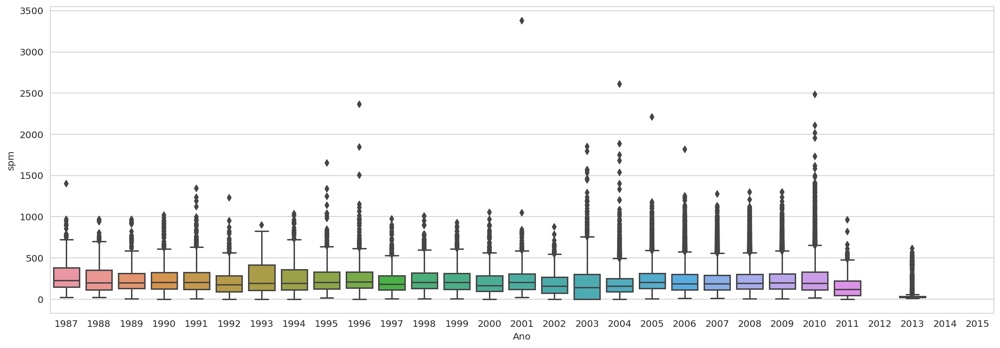

In [ ]:
plt.figure(figsize=(18,6))

sns.boxplot(x='Ano', y='spm', data=df)


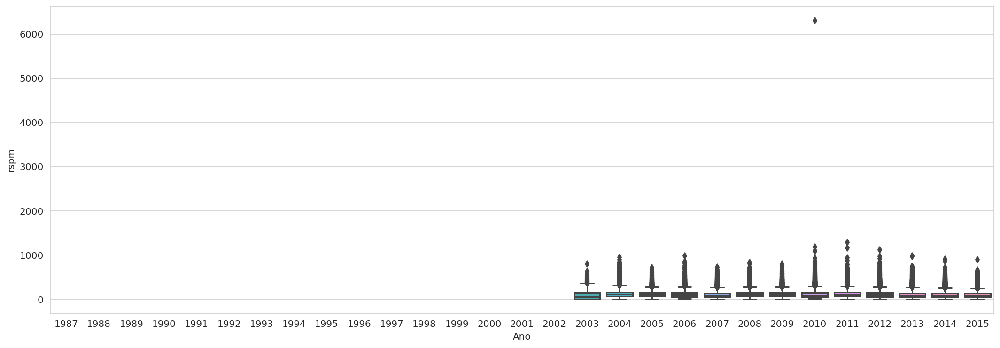

In [ ]:
plt.figure(figsize=(18,6))

sns.boxplot(x='Ano', y='rspm', data=df)

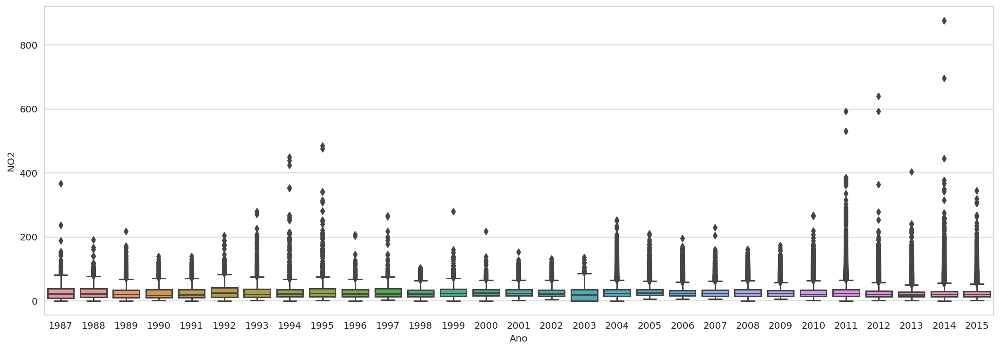

In [ ]:
plt.figure(figsize=(18,6))

sns.boxplot(x='Ano', y='NO2', data=df)

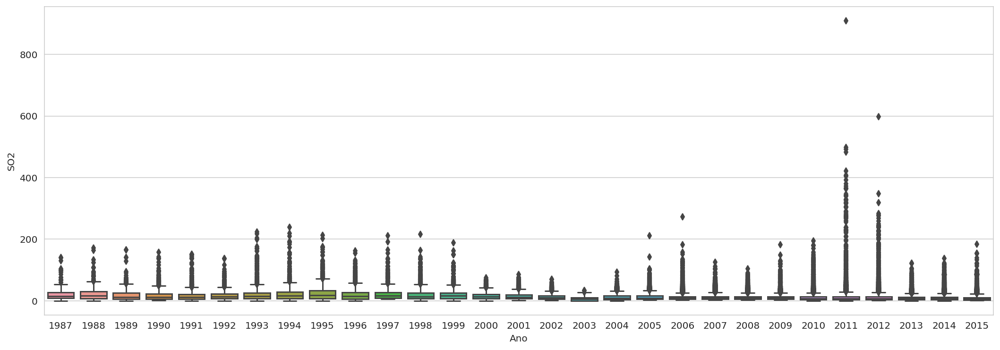

In [ ]:
plt.figure(figsize=(18,6))

sns.boxplot(x='Ano', y='SO2', data=df)

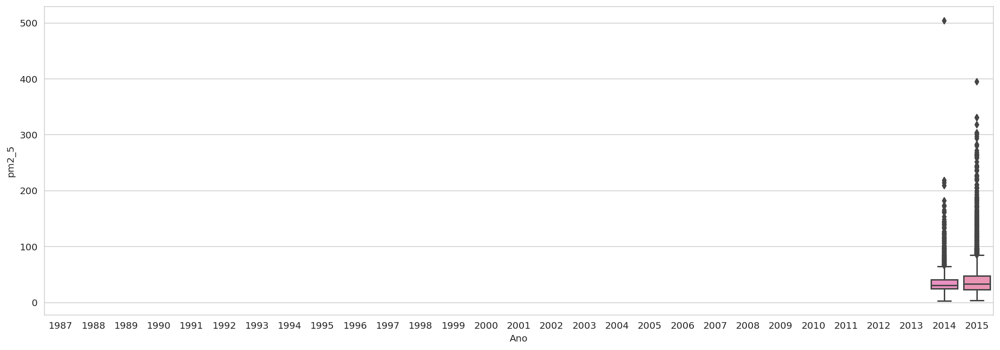

In [ ]:
plt.figure(figsize=(18,6))

sns.boxplot(x='Ano', y='pm2_5', data=df)

Os bloxplots acima demonstram uma grande quantidade de outliers, que apesar de serem visivelmente diferentes, não apresentam uma disparidade irrealista com os demais dados, podendo ser picos de poluição extrema

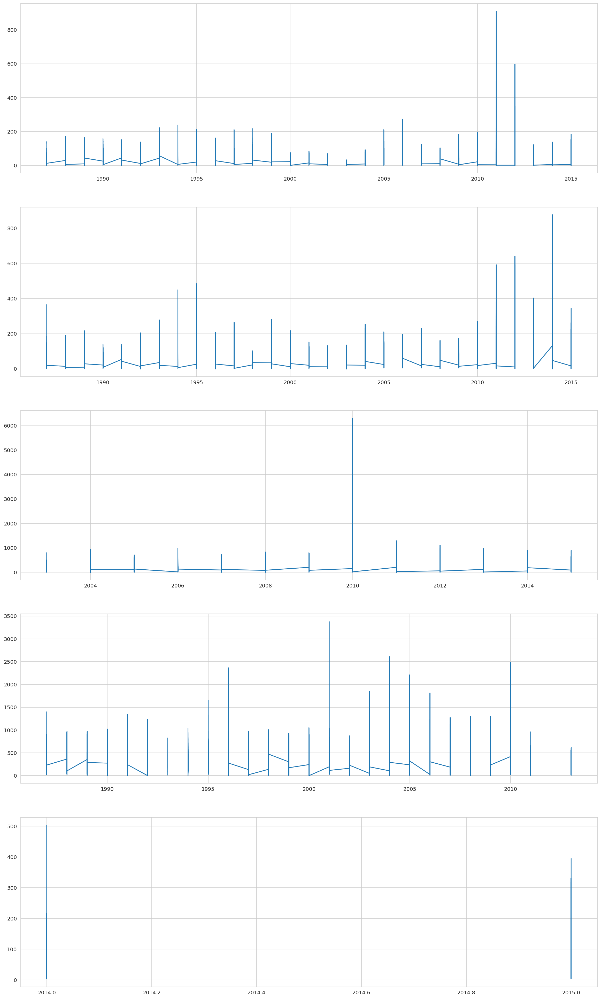

In [ ]:
df_by_year = df.sort_values(by = ['Ano'], ascending = True)

numerals = ['SO2','NO2','rspm','spm','pm2_5']

fig, ax = plt.subplots(5, figsize = (20, 35))
for count, column in enumerate(numerals):
    ax[count].plot(df_by_year['Ano'], df_by_year[column], label = column);

Apesar de terem multiplas amostragens por ano, o gráfico acima nos prova que precisamos analisar indiviudalmente cada localização, caso contrário a quantidade de dados e sua discrepância tornariam a análise pouco conclusiva.

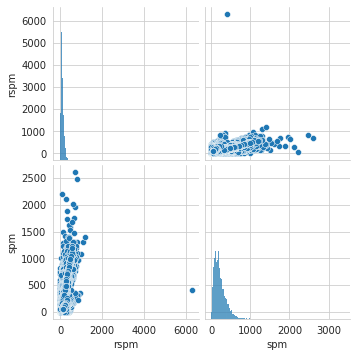

In [ ]:
numerals = ['rspm','spm']
%config InlineBackend.figure_format = 'png'
sns.pairplot(df[numerals]);

In [ ]:
%config InlineBackend.figure_format = 'retina' 

É possível através do pair plot confirmar o que foi observado no heatmap, demonstrando claramente que há uma correlação forte entre rspm e spm. Porém vale a pena ressaltar que estes dados apenas possuem valores válidos entre 2003 e 2013 

Uma das questões que essa base de dados levanta é o mínimo e máximo histórico de SO2 e NO2 e quais são os estados com maior média de poluição para essas variáveis.

In [ ]:
df.groupby(by=['Ano']).max().sort_values(by=['SO2'],ascending = False)['SO2']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: Dropping invalid columns in DataFrameGroupBy.max is deprecated. In a future version, a TypeError will be raised. Before calling .max, select only columns which should be valid for the function.
  """Entry point for launching an IPython kernel.


Ano
2011   909.00
2012   597.00
2006   273.30
1994   238.60
1993   223.60
1998   216.60
1995   212.70
1997   211.30
2005   211.00
2010   195.00
1999   188.40
2015   184.00
2009   182.20
1988   172.00
1989   165.10
1996   162.20
1990   158.30
1991   152.40
1987   140.60
1992   138.10
2014   138.00
2007   125.30
2013   122.00
2008   104.00
2004    93.00
2001    85.30
2000    75.60
2002    69.80
2003    33.00
Name: SO2, dtype: float64

In [ ]:
df.groupby(by=['Ano']).max().sort_values(by=['NO2'],ascending = False)['NO2']


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: Dropping invalid columns in DataFrameGroupBy.max is deprecated. In a future version, a TypeError will be raised. Before calling .max, select only columns which should be valid for the function.
  """Entry point for launching an IPython kernel.


Ano
2014   876.00
2012   640.00
2011   592.00
1995   484.30
1994   449.40
2013   403.00
1987   365.80
2015   344.00
1999   279.80
1993   278.90
2010   268.00
1997   265.20
2004   253.00
2007   229.50
2000   217.50
1989   217.00
2005   210.30
1996   206.90
1992   204.20
2006   195.50
1988   191.10
2009   173.20
2008   161.50
2001   152.80
1990   138.80
1991   138.60
2003   136.00
2002   131.80
1998   103.00
Name: NO2, dtype: float64

In [ ]:
df.groupby(by=['Estado']).max().sort_values(by=['SO2'],ascending = False)['SO2']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: Dropping invalid columns in DataFrameGroupBy.max is deprecated. In a future version, a TypeError will be raised. Before calling .max, select only columns which should be valid for the function.
  """Entry point for launching an IPython kernel.


Estado
Tamil Nadu             909.00
Maharashtra            597.00
West Bengal            498.00
Karnataka              230.00
Andhra Pradesh         228.00
Jharkhand              221.00
Gujarat                219.10
Bihar                  216.60
Madhya Pradesh         199.80
Uttar Pradesh          183.00
Meghalaya              178.00
Rajasthan              168.00
Punjab                 143.00
Puducherry             138.40
Delhi                  127.40
Kerala                 126.90
Goa                    108.60
Himachal Pradesh        81.00
Odisha                  68.00
Uttarakhand             60.80
Assam                   56.00
Chandigarh              55.50
Haryana                 48.30
Jammu & Kashmir         35.00
Daman & Diu             34.30
Telangana               32.60
Chhattisgarh            29.30
Dadra & Nagar Haveli    23.90
Sikkim                  19.80
Arunachal Pradesh       13.00
Mizoram                  8.00
Manipur                  5.90
Nagaland                 5.80
Nam

In [ ]:
df.groupby(by=['Estado']).max().sort_values(by=['NO2'],ascending = False)['NO2']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: Dropping invalid columns in DataFrameGroupBy.max is deprecated. In a future version, a TypeError will be raised. Before calling .max, select only columns which should be valid for the function.
  """Entry point for launching an IPython kernel.


Estado
Rajasthan              876.00
Himachal Pradesh       696.00
Maharashtra            640.00
West Bengal            592.00
Uttar Pradesh          592.00
Jharkhand              530.00
Andhra Pradesh         334.90
Tamil Nadu             315.00
Gujarat                279.80
Delhi                  224.00
Kerala                 217.50
Bihar                  203.80
Punjab                 201.00
Haryana                188.00
Karnataka              186.00
Puducherry             167.50
Assam                  147.90
Telangana              134.00
Madhya Pradesh         131.70
Odisha                 104.00
Chandigarh             103.00
Uttarakhand            101.00
Chhattisgarh            92.00
Goa                     81.00
Nagaland                61.70
Mizoram                 54.87
Daman & Diu             51.00
Dadra & Nagar Haveli    39.30
Meghalaya               38.00
Manipur                 37.70
Jammu & Kashmir         30.00
Sikkim                  26.80
Arunachal Pradesh       17.00
Nam

In [ ]:
location_list = df['Estado'].unique()
numerals = ['SO2','NO2','rspm','spm','pm2_5']
fig, ax = plt.subplots(location_list.size, figsize = (26, location_list.size*3))

for count, location in enumerate(location_list):
    for column in numerals:

        state = df.loc[ df['Estado'] == location, [column, 'Ano'] ]

        y = state.groupby(by = ['Ano']).mean()[column]
        x = state['Ano'].cat.categories
        ax[count].plot(x, y, label = column);

        ax[count].set_xticks(x)
        ax[count].set_xlim(min(x),max(x))
        ax[count].set_title(location)
        ax[count].set_xlabel("Ano")
        ax[count].legend();

plt.tight_layout()
    

A princípio é possível notar que que a maioria dos estados possuem dados faltosos para alguns anos e que o estado de Sikkim não possui dados, sendo impossível realizar qualquer análise e sendo recomendado a sua remoção do banco de dados

In [ ]:
df = df.loc[df['Estado'] != 'Sikkim']

Iremos separar o gráfico acima em três partes, SO2 e NO2, RSPM e SPM e PM2_5, já que as escalas destes variam de forma diferentes. 

In [ ]:
location_list = df['Estado'].unique()
numerals = ['SO2','NO2','rspm','spm','pm2_5']
fig, ax = plt.subplots(location_list.size, figsize = (26, location_list.size*3))

for count, location in enumerate(location_list):
    for column in numerals:
        state = df.loc[ df['Estado'] == location, [column, 'Ano'] ]

        y = state.groupby(by = ['Ano']).mean()[column]
        x = state['Ano'].cat.categories

        ax[count].plot(x, y, label = column);
        ax[count].set_xticks(x)
        ax[count].set_xlim(min(x),max(x))
        ax[count].set_title(location)
        ax[count].set_xlabel("Ano")
        ax[count].legend();
plt.tight_layout()



In [ ]:
location_list = df['Estado'].unique()
numerals = ['SO2','NO2']
fig, ax = plt.subplots(location_list.size, figsize = (26, location_list.size*3))

for count, location in enumerate(location_list):
    for column in numerals:
        state = df.loc[ df['Estado'] == location, [column, 'Ano'] ]

        y = state.groupby(by = ['Ano']).mean()[column]
        x = state['Ano'].cat.categories


        ax[count].plot(x, y, label = column);
        ax[count].set_xticks(x)
        ax[count].set_xlim(min(x),max(x))
        ax[count].set_title(location)
        ax[count].set_xlabel("Ano")
        ax[count].legend();
plt.tight_layout()
    

In [ ]:
location_list = df['Estado'].unique()
numerals = ['rspm','spm']
fig, ax = plt.subplots(location_list.size, figsize = (26, location_list.size*3))

for count, location in enumerate(location_list):
    for column in numerals:
        state = df.loc[ df['Estado'] == location, [column, 'Ano'] ]

        y = state.groupby(by = ['Ano']).mean()[column]
        x = state['Ano'].cat.categories

        ax[count].plot(x, y, label = column);
        ax[count].set_xticks(x)
        ax[count].set_xlim(min(x),max(x))
        ax[count].set_title(location)
        ax[count].set_xlabel("Ano")
        ax[count].legend();
plt.tight_layout()
    

In [ ]:
location_list = df['Estado'].unique()
numerals = ['pm2_5']
fig, ax = plt.subplots(location_list.size, figsize = (26, location_list.size*3))

for count, location in enumerate(location_list):
    for column in numerals:
        state = df.loc[ df['Estado'] == location, [column, 'Ano'] ]

        y = state.groupby(by = ['Ano']).mean()[column]
        x = state['Ano'].cat.categories
        
        ax[count].plot(x, y, label = column);
        ax[count].set_xticks(x)
        ax[count].set_xlim(min(x),max(x))
        ax[count].set_title(location)
        ax[count].set_xlabel("Ano")
        ax[count].set_ylabel(column)
        ax[count].legend();
plt.tight_layout()
    

Vê-se que PM2_5, o tamanho da partícula, apenas foi analisado nos ultimos anos, o que demonstra que esta variável é irrelevante para uma análise temporal. Desta forma, considerando que aproximadamente 98% dos seus dados são nulos.

Para tentar solucionar os vazios nos gráfiocs, tentaremos popular os dados nulos como a média de todos os anos utilizando o Simple imputer do sklearn.impute

In [ ]:
df2 = df.copy()

In [ ]:
numerals = ['SO2','NO2','rspm','spm']


imputer = SimpleImputer(missing_values=np.nan, strategy='mean')
df2[numerals] = imputer.fit_transform(df2[numerals])

In [ ]:
location_list = df2['Estado'].unique()
numerals = ['SO2','NO2','rspm','spm']
fig, ax = plt.subplots(location_list.size, figsize = (26, location_list.size*3))

for count, location in enumerate(location_list):
    for column in numerals:
        state = df2.loc[ df2['Estado'] == location, [column, 'Ano'] ]

        y = state.groupby(by = ['Ano']).mean()[column]
        x = state['Ano'].cat.categories
        
        ax[count].plot(x, y, label = column);
        ax[count].set_xticks(x)
        ax[count].set_xlim(min(x),max(x))
        ax[count].set_title(location)
        ax[count].set_xlabel("Ano")
        ax[count].legend();
plt.tight_layout()

Visto que os vazios nos gráficos continuam, é constado que na verdade são dados faltantes e não nulos. 